In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os


In [2]:
# getting the current working directory and and ealuation metrics folder
cwd = os.getcwd()
evaluation_folder = "\\EvaluationMetrics"
evaluatio_metrics_folder =cwd +evaluation_folder
evaluatio_metrics_folder

'd:\\CodeRepo\\Thesis\\Thesis\\ELM\\EvaluationMetrics'

In [12]:
# creating a dictionary with all evaluation metrics csv files
model_eval_metrics={}

# adding all the csv files in the directory to the
for  root, dir,file in  os.walk(evaluatio_metrics_folder):
    for item in file:
        if '.csv' in item:
            print(item)
            model_eval_metrics[item[:-4]]= pd.read_csv(evaluatio_metrics_folder+"\\"+item)
# print(model_eval_metrics)

TEST_t1_bert__binary_sigmoid.csv
TEST_t1_bert__biploar_step.csv
TEST_t1_bert__bipolar_sigmoid.csv
TEST_t1_bert__identity.csv
TEST_t1_bert__relu_leaky.csv
TEST_t1_xl__binary_sigmoid.csv
TEST_t1_xl__biploar_step.csv
TEST_t1_xl__bipolar_sigmoid.csv
TEST_t1_xl__identity.csv
TEST_t1_xl__relu_leaky.csv
TEST_t2_bert__binary_sigmoid.csv
TEST_t2_bert__biploar_step.csv
TEST_t2_bert__bipolar_sigmoid.csv
TEST_t2_bert__identity.csv
TEST_t2_bert__relu_leaky.csv
TEST_t2_xl__binary_sigmoid.csv
TEST_t2_xl__biploar_step.csv
TEST_t2_xl__bipolar_sigmoid.csv
TEST_t2_xl__identity.csv
TEST_t2_xl__relu_leaky.csv
TRAIN_t1_bert__binary_sigmoid.csv
TRAIN_t1_bert__biploar_step.csv
TRAIN_t1_bert__bipolar_sigmoid.csv
TRAIN_t1_bert__identity.csv
TRAIN_t1_bert__relu_leaky.csv
TRAIN_t1_xl__binary_sigmoid.csv
TRAIN_t1_xl__biploar_step.csv
TRAIN_t1_xl__bipolar_sigmoid.csv
TRAIN_t1_xl__identity.csv
TRAIN_t1_xl__relu_leaky.csv
TRAIN_t2_bert__binary_sigmoid.csv
TRAIN_t2_bert__biploar_step.csv
TRAIN_t2_bert__bipolar_sigmoid

In [26]:
BertTestResults_DF= pd.read_csv(evaluatio_metrics_folder+"\\"+"TRAIN_t1_bert__binary_sigmoid.csv")
BertTestResults_DF

,Unnamed: 0,HiddenNodes,lit_accuracy,lit_precision,lit_recall,lit_f1,sklearn_hamLoss,sklearn_accuracy,term_wise_accuracy,sklearn_macro_precision,...,sklearn_macro_recall,sklearn_micro_recall,sklearn_macro_f1,sklearn_micro_f1,activation,type,phase,total_time,model_nm,Unnamed: 0.1
0,0,100,0.087412,0.190591,0.094593,0.126435,0.040759,0.034729,0.959241,0.061126,...,0.009627,0.079926,0.012638,0.141082,_binary_sigmoid,t1_bert,train,8.632929,t1_bert_100__binary_sigmoid_uniform,0.0
1,1,200,0.107097,0.222217,0.116278,0.152669,0.040260,0.045802,0.959740,0.186421,...,0.012766,0.095768,0.017146,0.166148,_binary_sigmoid,t1_bert,train,10.730136,t1_bert_200__binary_sigmoid_uniform,1.0
2,2,300,0.121757,0.245031,0.131886,0.171476,0.039934,0.054560,0.960066,0.119557,...,0.014023,0.104705,0.018804,0.180077,_binary_sigmoid,t1_bert,train,12.759888,t1_bert_300__binary_sigmoid_uniform,2.0
3,3,400,0.130451,0.264059,0.140744,0.183619,0.039696,0.057781,0.960304,0.197972,...,0.015608,0.113439,0.020946,0.193141,_binary_sigmoid,t1_bert,train,14.852728,t1_bert_400__binary_sigmoid_uniform,3.0
4,4,500,0.136637,0.274705,0.147913,0.192289,0.039510,0.060701,0.960490,0.233885,...,0.016953,0.119668,0.023066,0.202364,_binary_sigmoid,t1_bert,train,17.010756,t1_bert_500__binary_sigmoid_uniform,4.0
5,5,600,0.154187,0.303042,0.165696,0.214247,0.039086,0.070566,0.960914,0.207288,...,0.019143,0.132058,0.025959,0.220582,_binary_sigmoid,t1_bert,train,20.182068,t1_bert_600__binary_sigmoid_uniform,NaN
6,6,700,0.156245,0.307823,0.168004,0.217371,0.038910,0.071774,0.961090,0.320088,...,0.020593,0.136154,0.028695,0.226668,_binary_sigmoid,t1_bert,train,22.332287,t1_bert_700__binary_sigmoid_uniform,NaN
7,7,800,0.162187,0.320199,0.174970,0.226287,0.038666,0.073082,0.961334,0.362127,...,0.022868,0.142722,0.032529,0.236164,_binary_sigmoid,t1_bert,train,24.463587,t1_bert_800__binary_sigmoid_uniform,NaN
8,8,900,0.172958,0.334583,0.186654,0.239627,0.038355,0.078619,0.961645,0.460737,...,0.025539,0.151625,0.036807,0.248764,_binary_sigmoid,t1_bert,train,26.697614,t1_bert_900__binary_sigmoid_uniform,NaN
9,9,1000,0.181750,0.351288,0.195349,0.251076,0.038004,0.082444,0.961996,0.415760,...,0.027844,0.159513,0.040507,0.260123,_binary_sigmoid,t1_bert,train,27.766756,t1_bert_1000__binary_sigmoid_uniform,5.0


In [ ]:
if 'Unnamed: 0' in BertTestResults_DF.columns:
    BertTestResults_DF.drop('Unnamed: 0', axis=1,inplace=True)

In [ ]:
BertTestResults_DF

In [ ]:
BertTestResults_DF.describe()

In [ ]:
BertTestResults_DF.columns

In [ ]:
import functools
def conjunction(*conditions):
    return functools.reduce(np.logical_and, conditions)

def plotSeparate(df):
    """
    separate df on activation function 
    """
    df_dict={}
    for phases in df.phase.unique():
        for types in df.type.unique():
            for activations in df.activation.unique():
                c1=df.phase==phases
                c2=df.type==types
                c3=df.activation==activations
                _df= df[conjunction(c1,c2,c3)]
                row_count= _df.shape[0]
                if (row_count>0):
                    _df["Metrics"]=pd.Series(np.zeros(shape=row_count))
                    df_dict[phases+"_"+types+"_"+activations]=_df


    # df_dict ={key:val for key, val in df_dict.items() if val.shape[0] > 0} 
    return df_dict


    
separated_dict=plotSeparate(BertTestResults_DF)




In [ ]:
for x in separated_dict.keys():
    print(separated_dict[x].columns)

In [60]:
def generate_metrics_graph(df_dict, phase = '' ,activation = '', embedding_type= '', embedding_name= '', show_time =False ):
    """
    df_dict = dictionary containing all the file names
    phase = 'TRAIN'  'TEST'
    actiation =  binary_sigmoid  biploar_step bipolar_sigmoid identity v
    embedding_type = t1 t2
    embedding_name = bert  xl
    When every value is none all the data will be converted into the graphs
    when a certain value is given, the corresponding subset of data will be converted into graphs
    """
    subset=[]
    for df_name in df_dict.keys():
        if phase in df_name and activation in df_name and embedding_type in df_name and embedding_name in df_name:
            subset.append(df_name)
    
    for df_name in subset:
        # plt.figure(figsize=(20,10))
        # plt.title(df_name)
        _df= df_dict[df_name]
        fig, ax= plt.subplots(2,2, sharex=True, sharey=True)
        fig.set_figwidth(20)
        fig.set_figheight(10)

        ax[0,0].title.set_text("Accuracy, Term wise Accuracy and Hamming Loss")
        # ax[0,0].plot(_df["HiddenNodes"], _df["Metrics"])
        ax[0,0].plot(_df["HiddenNodes"], _df["term_wise_accuracy"], '.-', label="term_wise_accuracy")
        ax[0,0].plot(_df["HiddenNodes"], _df["sklearn_hamLoss"],  '.-',label="sklearn_hamLoss")
        ax[0,0].plot(_df["HiddenNodes"], _df["sklearn_accuracy"],  '.-',label="sklearn_accuracy")
        ax[0,0].legend()


        ax[0,1].title.set_text("Metrics @ Literature Defination")

        ax[0,1].plot(_df["HiddenNodes"], _df["lit_accuracy"],  '.-',label="lit_accuracy")
        ax[0,1].plot(_df["HiddenNodes"], _df["lit_precision"],  '.-',label="lit_precision")
        ax[0,1].plot(_df["HiddenNodes"], _df["lit_recall"],  '.-',label="lit_recall")
        ax[0,1].plot(_df["HiddenNodes"], _df["lit_f1"],  '.-',label="lit_f1")
        ax[0,1].legend()


        ax[1,0].title.set_text("Macro Metrics")

        ax[1,0].plot(_df["HiddenNodes"], _df["sklearn_macro_precision"], '.-', label="sklearn_macro_precision")
        ax[1,0].plot(_df["HiddenNodes"], _df["sklearn_macro_recall"],  '.-',label="sklearn_macro_recall")
        ax[1,0].plot(_df["HiddenNodes"], _df["sklearn_macro_f1"],  '.-',label="sklearn_macro_f1")
        ax[1,0].legend()

        ax[1,1].title.set_text("Micro Metrics")

        ax[1,1].plot(_df["HiddenNodes"], _df["sklearn_micro_precision"], '.-', label="sklearn_micro_precision")
        ax[1,1].plot(_df["HiddenNodes"], _df["sklearn_micro_recall"], '.-', label="sklearn_micro_recall")
        ax[1,1].plot(_df["HiddenNodes"], _df["sklearn_micro_f1"], '.-', label="sklearn_micro_f1")
        ax[1,1].legend()


        fig.suptitle(df_name)
            # plt.show()
        if show_time:
            plt.figure(figsize=(20,10))
            plt.title(df_name)
            sns.lineplot(data=df_dict[df_name], x="HiddenNodes",y="total_time", label="Time (Seconds)", marker ='o')
            plt.show()


        # sns.lineplot(data=df_dict[df_name], x="HiddenNodes",y="term_wise_accuracy", label="term_wise_accuracy")


In [61]:
'' in 'asdasd'

True

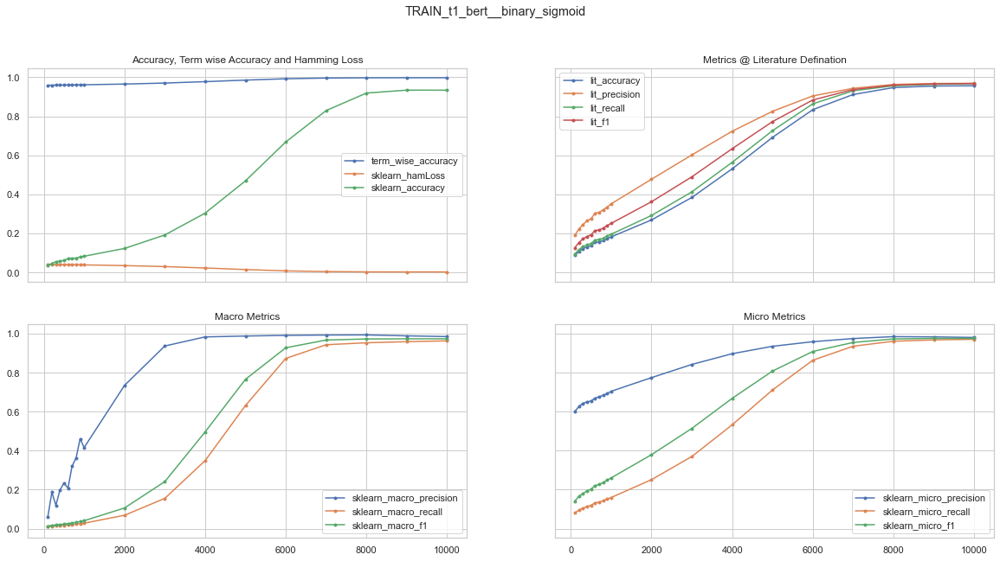

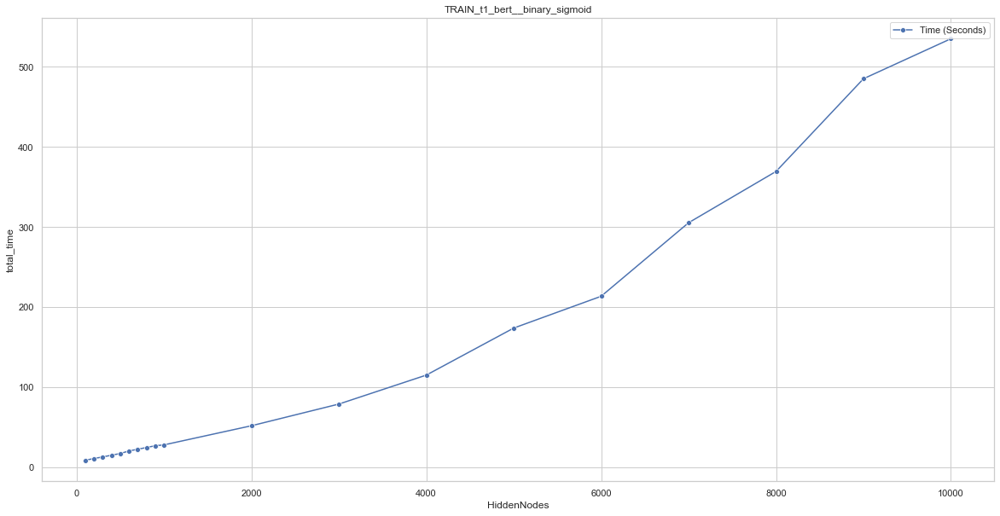

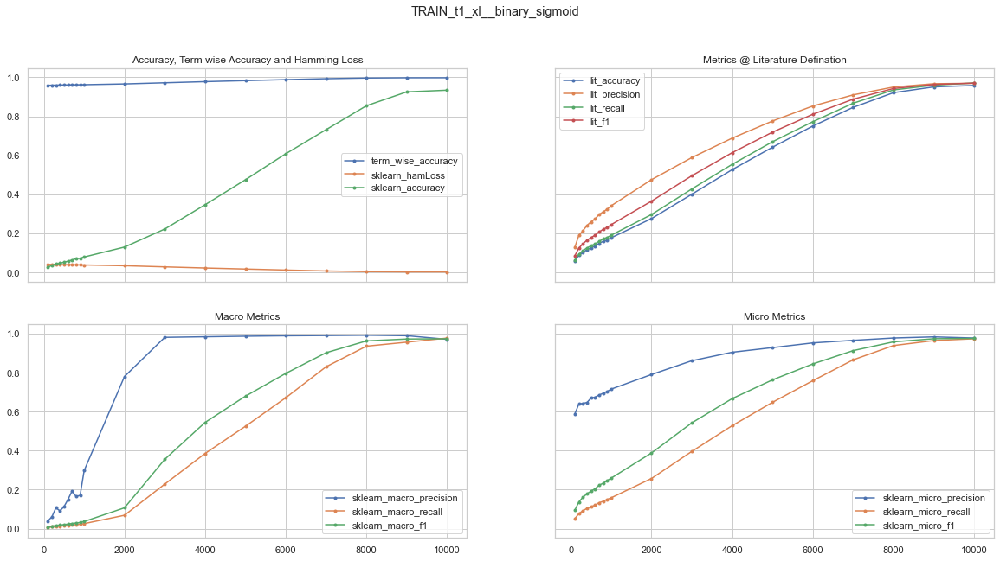

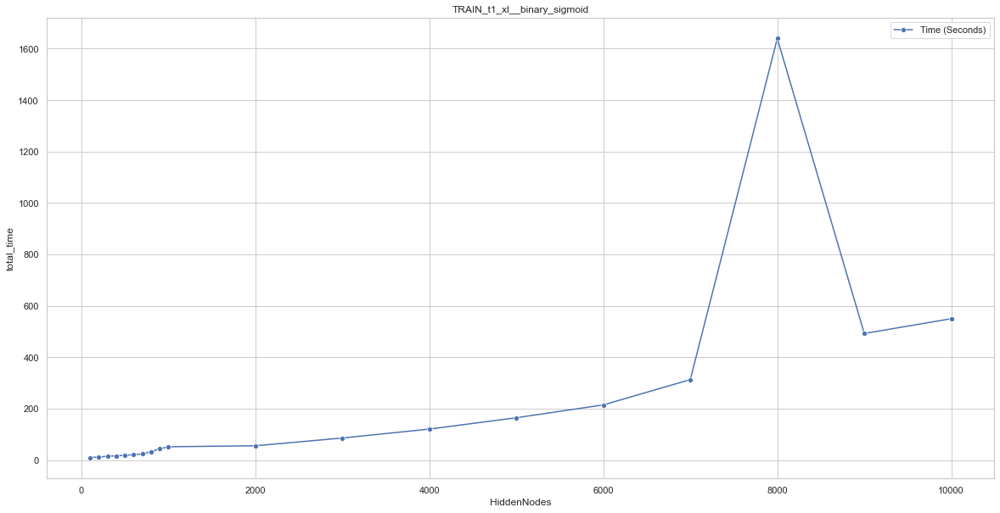

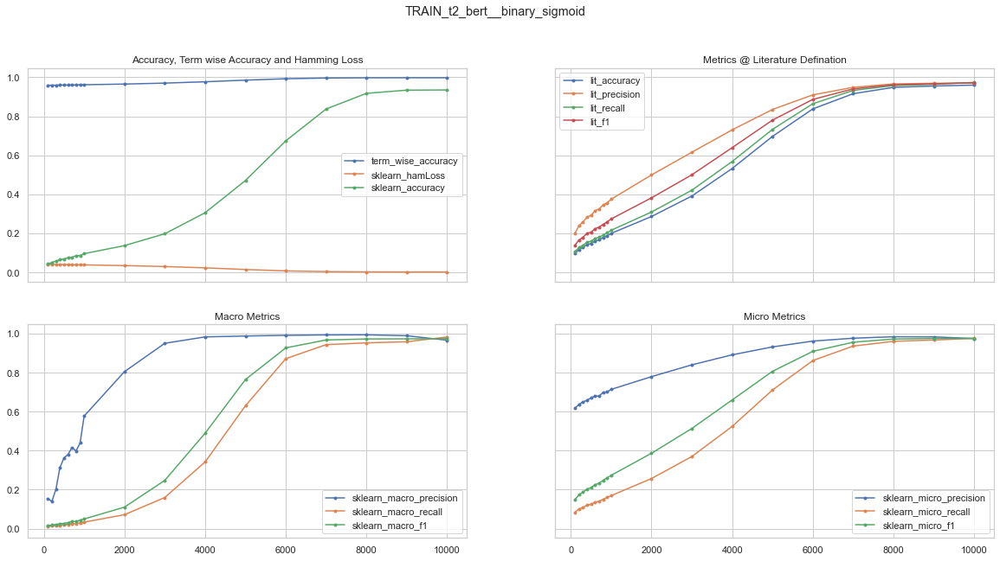

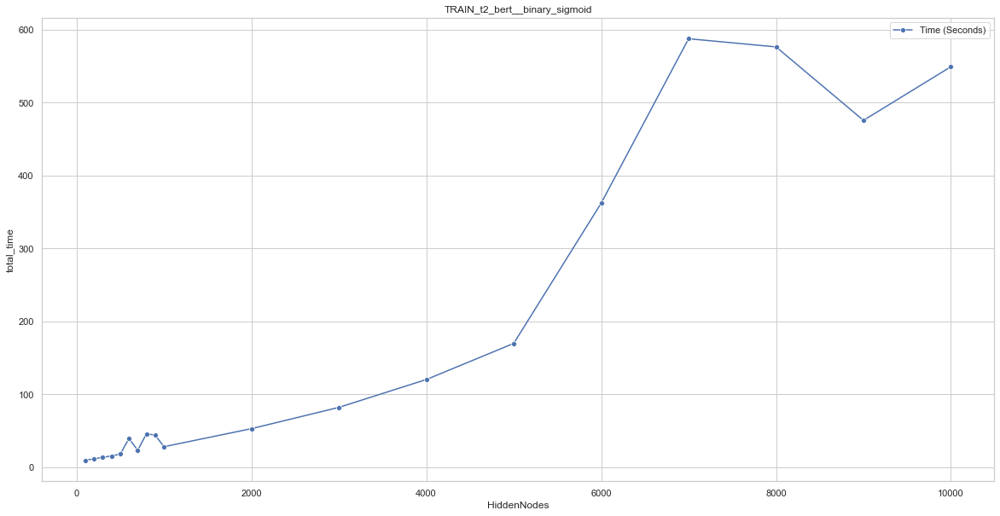

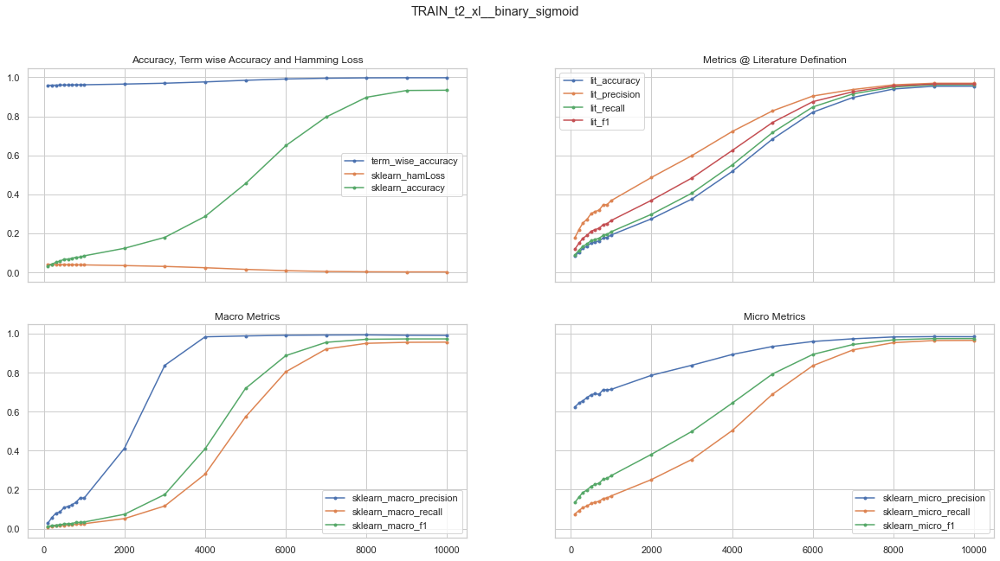

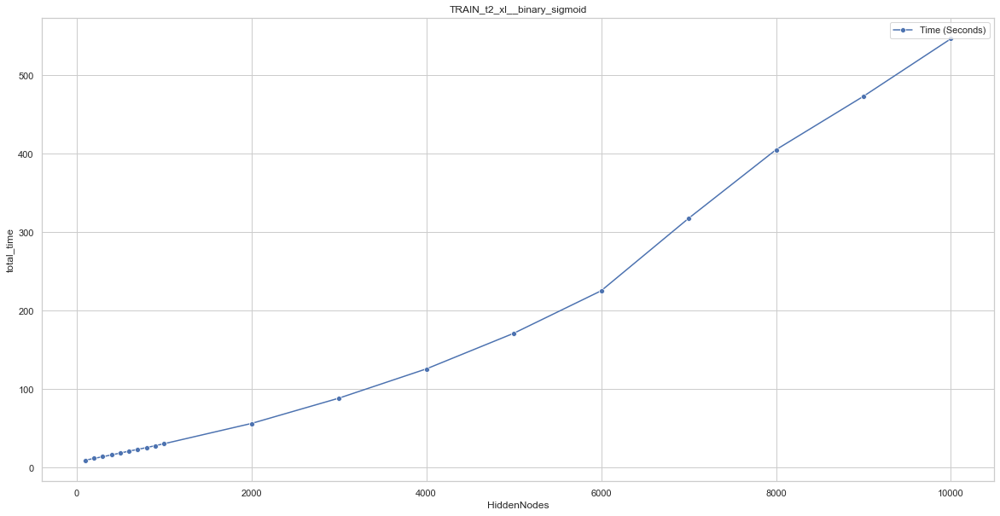

In [62]:
generate_metrics_graph(model_eval_metrics, phase= "TRAIN", activation = "binary_sigmoid", show_time=True)



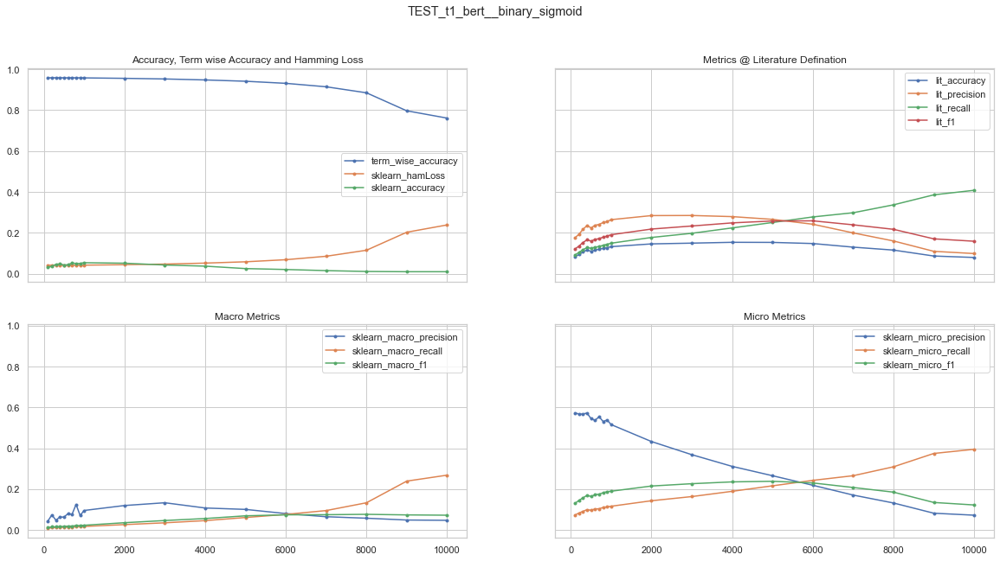

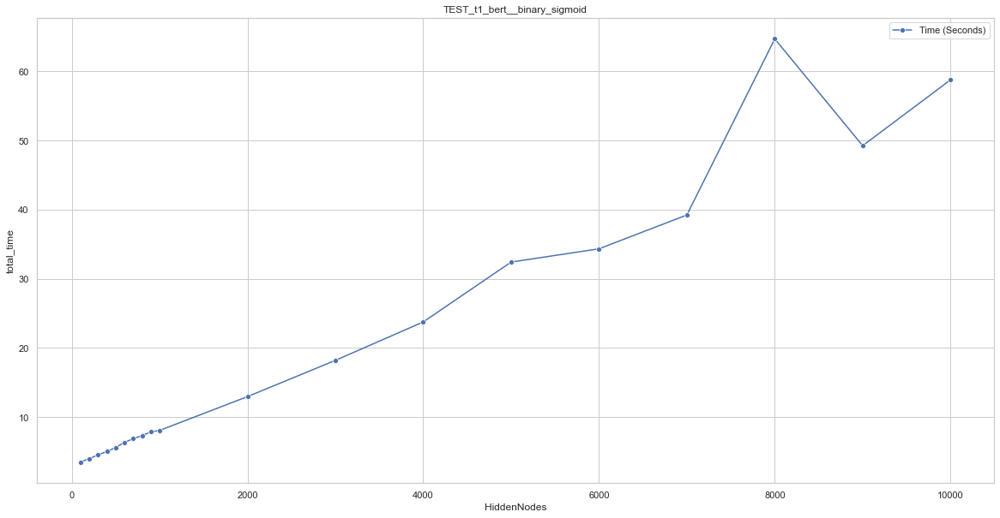

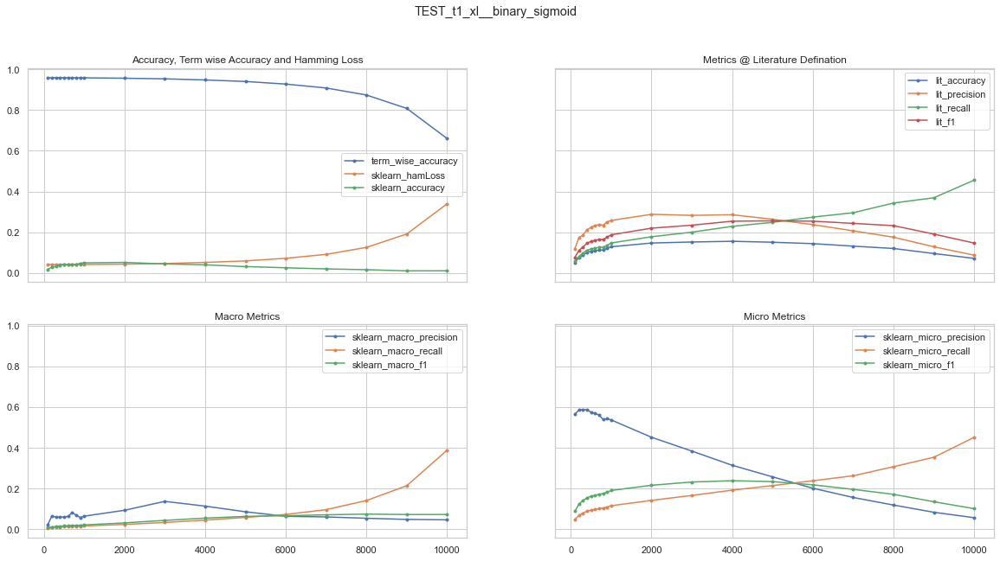

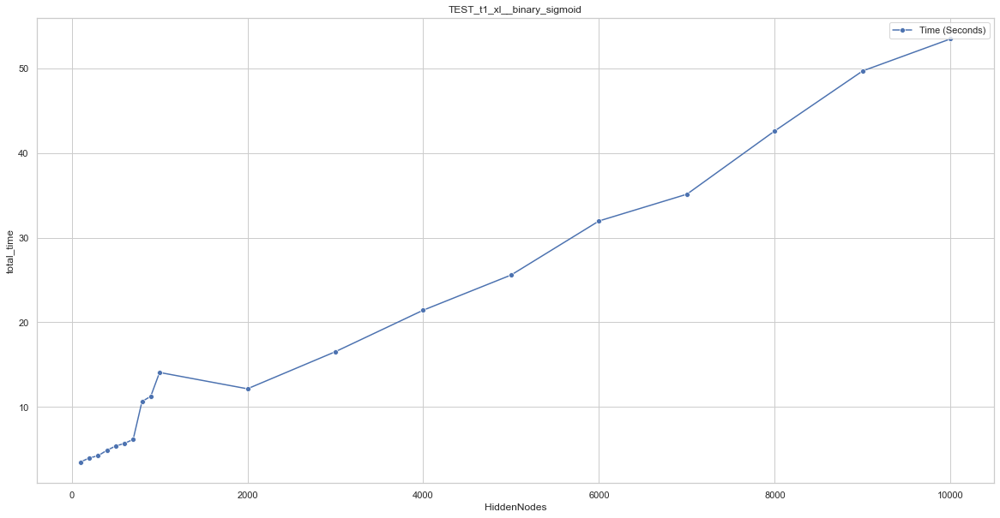

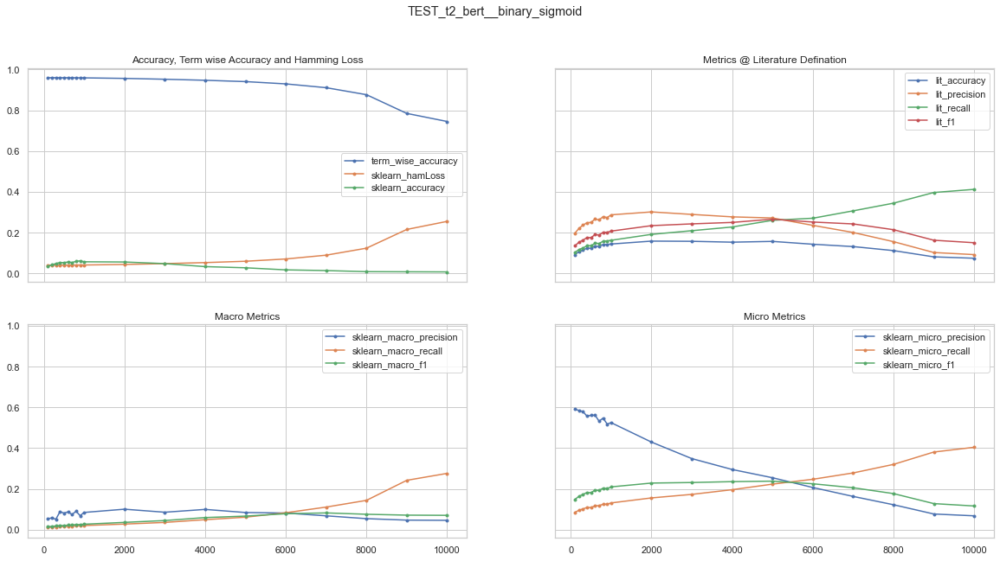

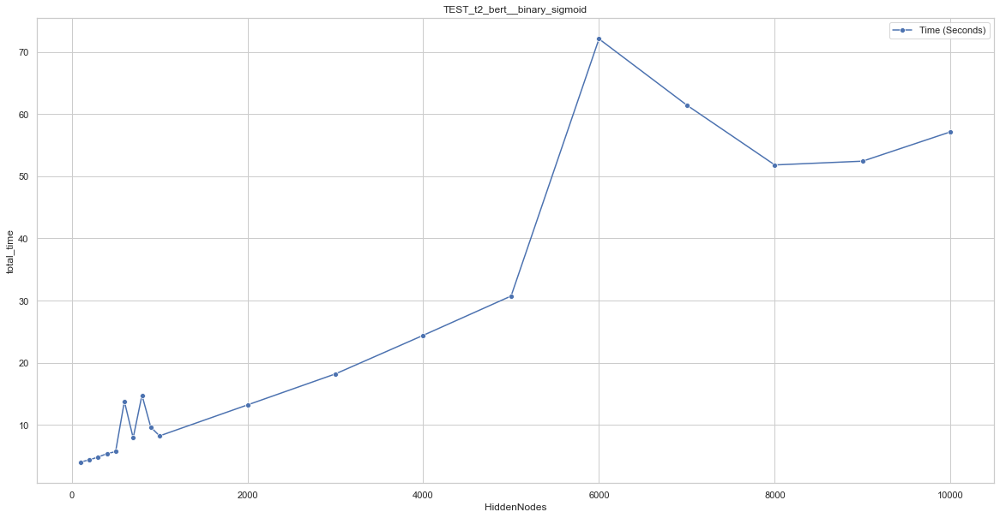

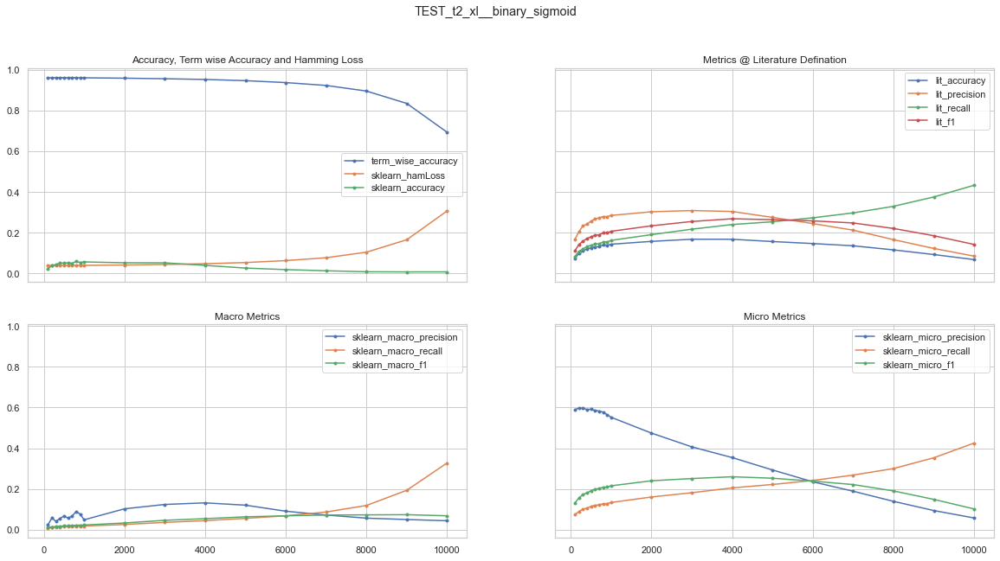

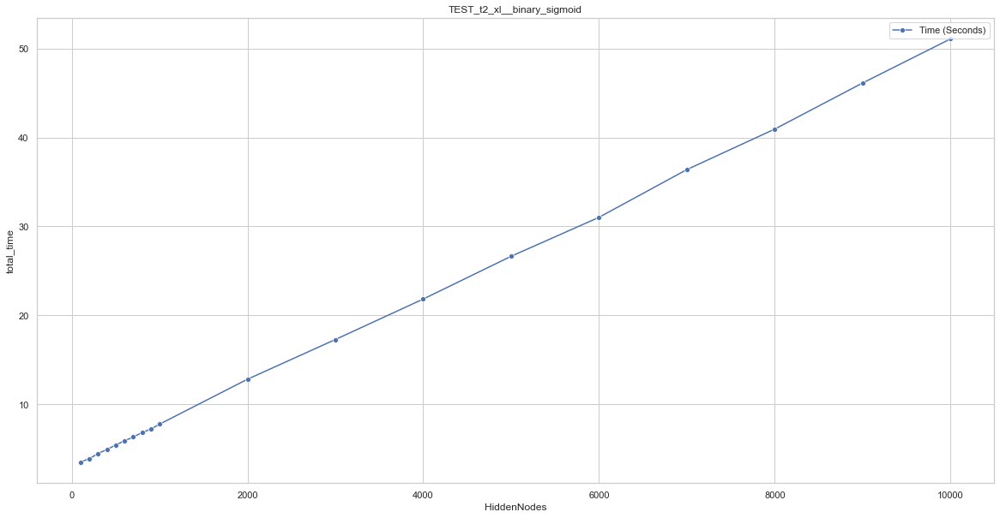

In [63]:
generate_metrics_graph(model_eval_metrics, phase= "TEST", activation = "binary_sigmoid", show_time=True)



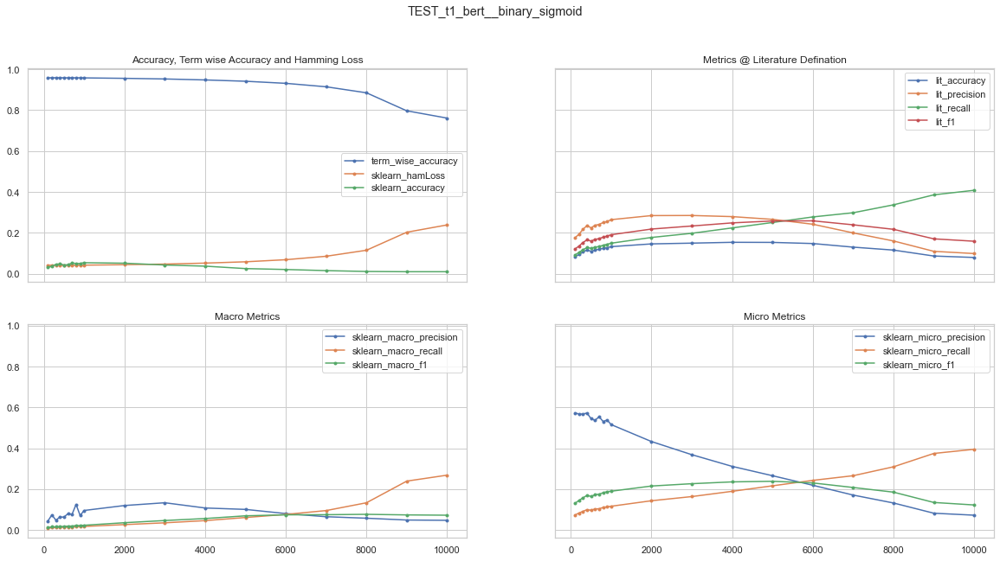

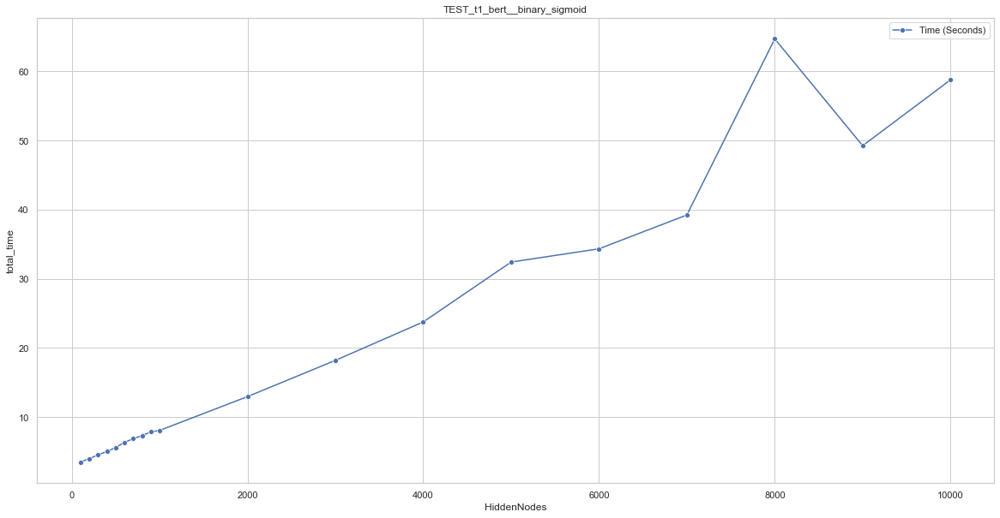

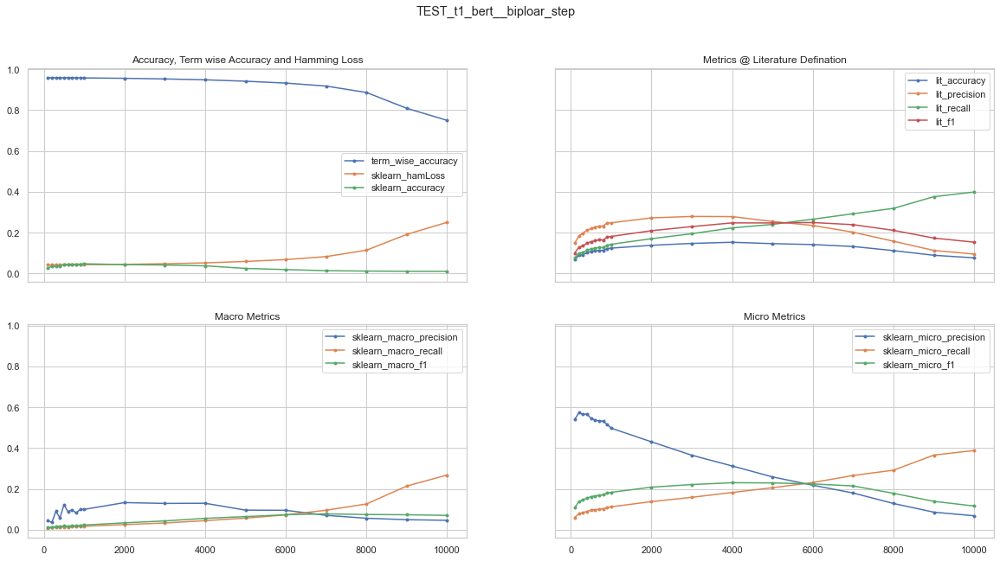

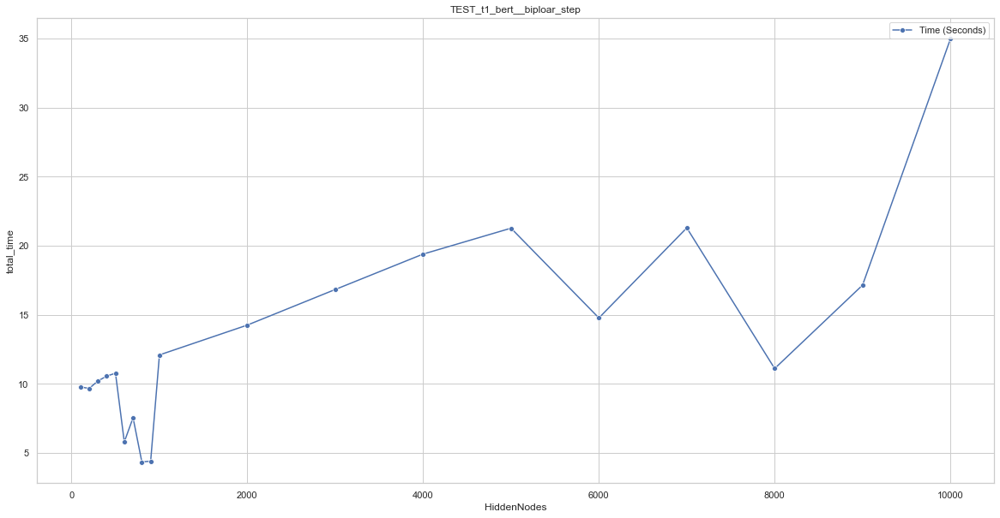

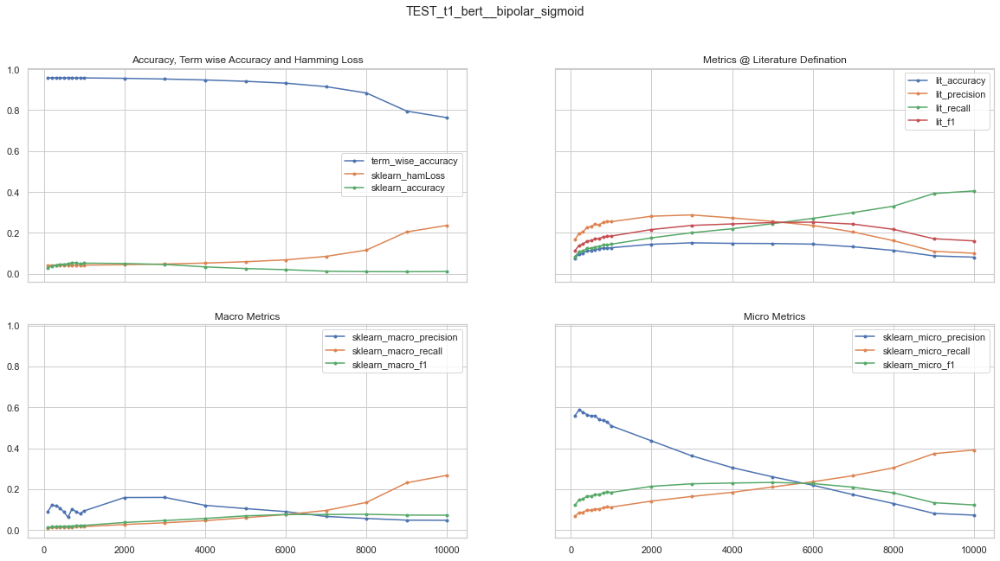

...

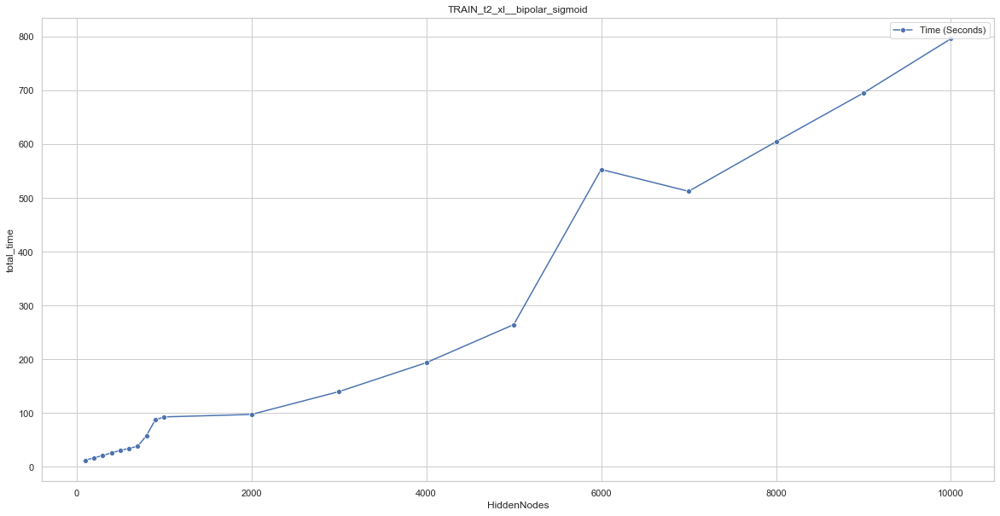

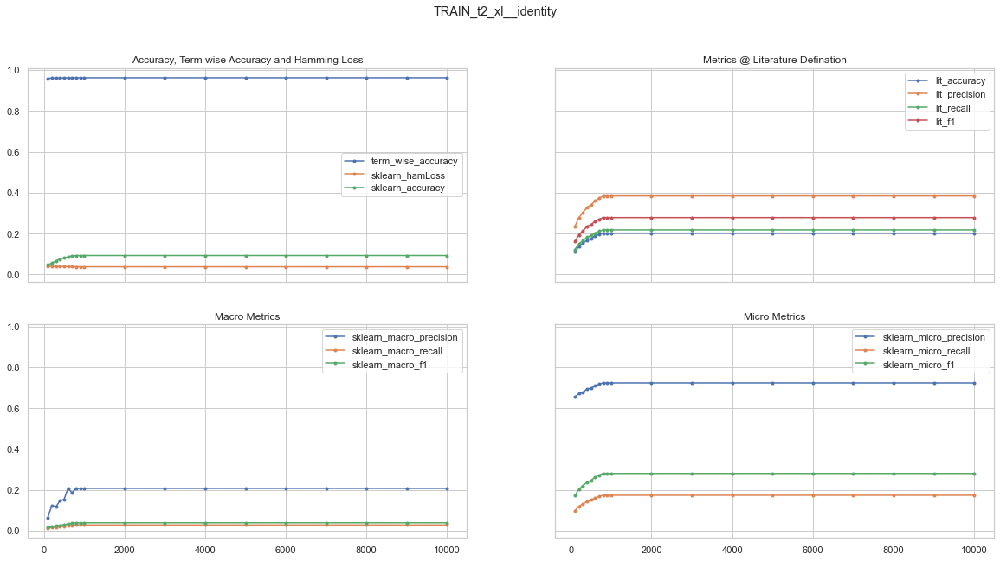

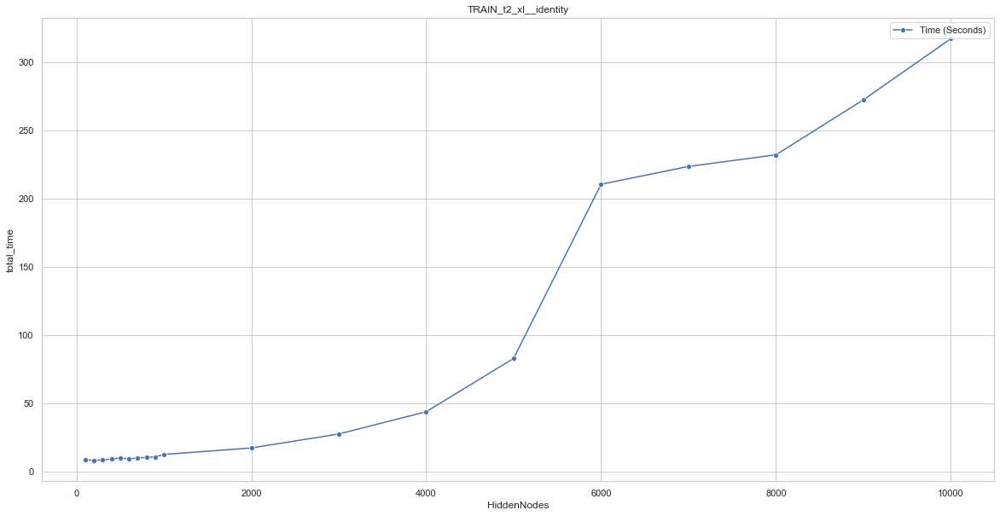

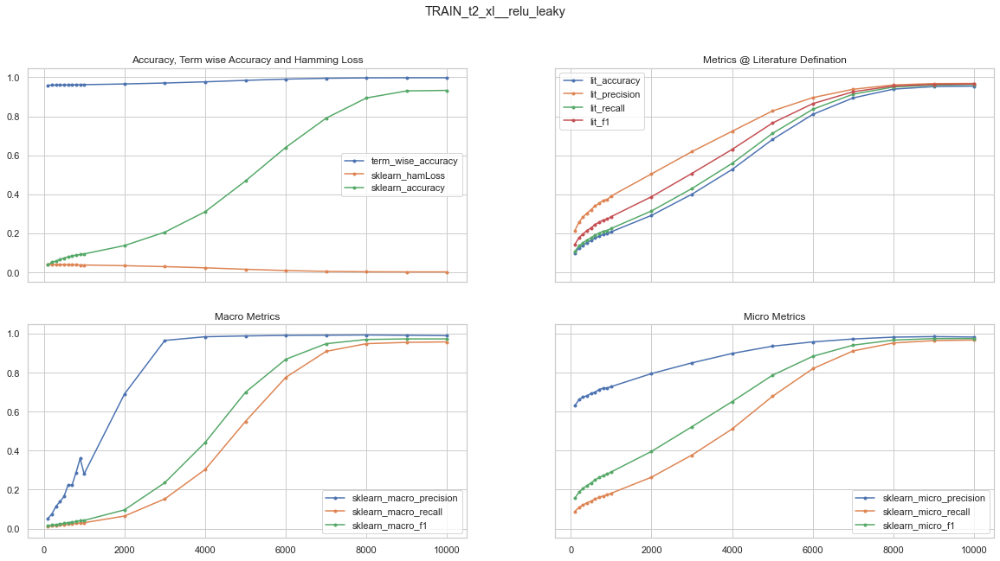

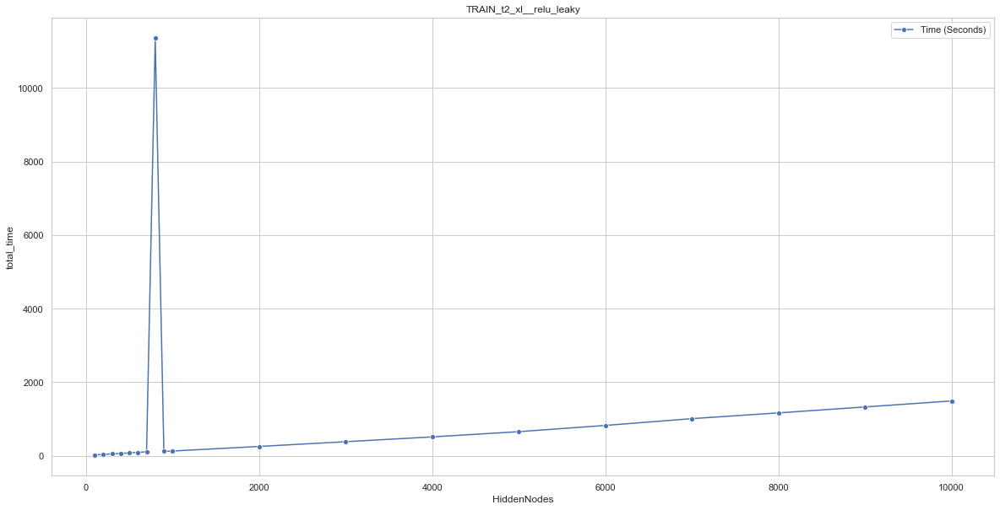

In [64]:
# FOR ALL THE GRAPHS
generate_metrics_graph(model_eval_metrics, show_time=True)
